Imports and installs

In [ ]:
!pip install googletrans==4.0.0-rc1

import csv
import numpy as np
from googletrans import Translator
import time as t
import re
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 1.9 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17397 sha256=08095784a8cb84a8753544e76ec05894803ee77be3d3c878d76cf304409b3bca
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: h11
    Found existing installation: h11 0.14.0
    Uninstalling h11-0.14.0:
      Succ

Helper functions

In [ ]:
# Initialize the Translator
translator = Translator()

def is_english(text):
    return all(ord(char) < 128 for char in text)

def translate_text(x):
    if len(x) > 0 and not is_english(x) and "á" not in x and "é" not in x and "í" not in x and "ó" not in x:
        try:
            t.sleep(1)  # Delay to prevent rate limiting
            translation = translator.translate(x, dest='en').text
            return translation
        except Exception as e:
            print(f"Error translating {x}: {e}")
            return x  # Return original text on error
    return x  # Return original text if it's English or null

def remove_emoticons(text):
    emoticon_pattern = re.compile(r"[:;=xX()]- ?[:;()DPp3/]")
    return emoticon_pattern.sub(r'', text)

def remove_emojis(data):
    emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
    return re.sub(emoj, '', data)

Creating full_text.csv

In [ ]:
# Turn full_text.txt into .csv
f = open("/content/drive/MyDrive/full_text.txt", errors="ignore")

data = [["user", "lat", "lon", "text"]]

counter = 0
for line in f:
    user, time, cords, lat, lon, text = line.split("\t")
    text = text[:-1]

    data.append([user, time, lat, lon, text])
    counter += 1

    if counter % 50000 == 0:
        print("Progress", round(counter/377616 * 100), "%")

with open("data.csv", "w", newline="") as f:
    writer = csv.writer(f, escapechar='\\')
    writer.writerows(data)
print("Done")

Progress 13 %
Progress 26 %
Progress 40 %
Progress 53 %
Progress 66 %
Progress 79 %
Progress 93 %
Done


Creating city_state.csv

In [ ]:
# Turn state_city.txt into .csv and translate
f = open("/content/drive/MyDrive/state_city.txt", errors="ignore")

data = [["lat", "lon", "city", "state"]]

counter = 0
bad = 0
for line in f:
    location = line.split("\t")

    # cleaning line
    if(location[-1] == "\n"):
        location = location[:-1]

    # removeing non city,state combos
    if(len(location) < 3 or location[-1] == ""):
        bad += 1
        print("Invalid location: ", location)
        continue

    # cleaning state
    location[-1] = location[-1][:-1]

    lat, lon, city, state = [],[],[],""

    if len(location) == 3:
        lat, lon, city = location[0], location[1], location[2]
    else:
        lat, lon, city, state = location[0], location[1], location[2], location[3]

    data.append([lat, lon, translate_text(city), translate_text(state)])
    counter += 1

    if counter % 10000 == 0:
        print("Progress", round(counter/46321 * 100), "%")

# These are just coords with no city or state attachedS
print("Bad cities/states: ", bad)

with open("translated_state_city.csv", "w", newline="") as f:
    writer = csv.writer(f, escapechar='\\')
    writer.writerows(data)

print("Done")

Invalid location:  ['18.059533', '-76.126374', '']
Progress 22 %
Progress 43 %
Progress 65 %
Progress 86 %
Bad cities/states:  1
Done


Cleaning and adding location to final_data.csv

In [ ]:
# Creating final Data
location_data = np.loadtxt("/content/translated_state_city.csv",delimiter=",",dtype=str)
location_lat = location_data[:, 0]
location_lon = location_data[:, 1]
location_city = location_data[:, 2]
location_state = location_data[:, 3]


data = [["user", "time", "lat", "lon", "city", "state", "text"]]
f = open("/content/data.csv", errors="ignore")

counter = 0
for line in f:
    # skip first line
    if counter == 0:
        counter +=1
        continue

    # in form of [user, time, lat, lon, text, (extra text seperated by comma)]
    info = line.split(",")

    user = info[0]
    time = info[1]
    lat = info[2]
    lon = info[3]

    # fixing text because it gets messed up when seperated by commas
    if(len(info) > 5):
        extended_text = info[4:]
        info = info[:5]
        text = ""
        for i in range(len(extended_text)):
            text += extended_text[i] + ","
        # removing new line from text
        text = text[:-1]
        info[4] = text


    # removing new line from text
    info[4] = info[4][:-1]

    # checking where lat and lon are found in city_state.txt
    indices = np.where(location_lat == lat)[0]

    city, state = "",""

    # If lat and lon dont exist
    if indices.size == 0:
        print("Lat:", lat, "Lon:", lon, "Text:", text)
        print("This location doesn't exit")
        continue

    # checking each instance of lat and lon
    if len(indices) > 1:
        for i in indices:
            if(location_lon[i] == lon):
                city = location_city[i]
                state = location_state[i]
                break
    else:
        city = location_city[indices[0]]
        state = location_state[indices[0]]


    user = info[0]
    time = info[1]
    text = info[4]

    # will skil if there is no tweet
    if(len(text) == 0):
        print(info)
        print("This data doesn't have any text!")
        continue

    # Some text includes > and < signs
    if("&gt;" in text):
        text = text.replace("&gt;", ">")
    if("&lt;" in text):
        text = text.replace("&lt;", "<")

    # remove emoticons like :)
    text = remove_emoticons(text)

    # remove emojis
    text = remove_emojis(text)

    data.append([user, time, lat, lon, city, state, text])

    counter += 1
    if counter % 50000 == 0:
        print("Progress", round(counter/377616 * 100), "%")

with open("final_data.csv", "w", newline="") as f:
    writer = csv.writer(f, escapechar='\\')
    writer.writerows(data)

print("Done")

Progress 13 %
Progress 26 %
Progress 40 %
Lat: 18.059533 Lon: -76.126374 Text: Fuck I had so much to tweet in the hour so I'm gonna do it now
This location doesn't exit
Lat: 18.059533 Lon: -76.126374 Text: Fuck I had so much to tweet in the hour so I'm gonna do it now
This location doesn't exit
Lat: 18.059533 Lon: -76.126374 Text: Fuck I had so much to tweet in the hour so I'm gonna do it now
This location doesn't exit
Lat: 18.059533 Lon: -76.126374 Text: @USER_a2663ef7 This is it..... We don't know how to act sometimes
This location doesn't exit
Lat: 18.059533 Lon: -76.126374 Text: @USER_a2663ef7 This is it..... We don't know how to act sometimes
This location doesn't exit
Lat: 18.059533 Lon: -76.126374 Text: @USER_a2663ef7 This is it..... We don't know how to act sometimes
This location doesn't exit
Progress 53 %
Progress 66 %
Progress 79 %
Progress 93 %
Done


In [ ]:
# prompt: Select 10 random enteries

import pandas as pd

# Assuming your data is in a CSV file named "final_data.csv"
df = pd.read_csv("final_data.csv")

# Select 10 random entries
random_entries = df.sample(n=10)

print(random_entries['state'])
print(random_entries['text'].to_list())

296100          New York
105420          New York
146894             Texas
216414        California
304116          New York
61135            Ontario
13964            Georgia
23895     North Carolina
229582          New York
217804          New York
Name: state, dtype: object
['@USER_cba175e0 #irefuseto not stoppin until i take your celibacy lmaoo ', "I'm going to my old skool to play ball then the hit gym for a work out", "RT @USER_8aba73b4:I've decided that I'm not havin sex for 3 months.And maybe longer if I can hold out lol<whattttt theeee fuckkkkk(wayne voice)", ': 5 Days till ---> A.R.A.B. + The Jacka + Revolutionary Me Clothing in San Jose CA. $20 @ the door hit me for discount presale tix!', '@USER_94ffd0fe that totally went over your head lol', "@USER_6af1d8dd Hey...you know I'm only joking! Alll loove amigo!", '@USER_f1a81da1 SMH!', 'Why am I full? Damn potatoes! Lol', '@USER_0dba22ef', 'Last night was a good good night']


In [ ]:
# prompt: List the number of each samples by state

# Assuming your data is in a CSV file named "final_data.csv"
df = pd.read_csv("final_data.csv")

# Group by state and count the number of samples in each state
state_counts = df.groupby('state')['state'].count()

state_counts

In [ ]:
# prompt: find the most common words from text by state

# Assuming your data is in a CSV file named "final_data.csv"
df = pd.read_csv("final_data.csv")

# Create an empty dictionary to store the most common words for each state
state_word_counts = {}

# Iterate through each state
for state in df['state'].unique():
    # Filter the DataFrame for the current state
    state_df = df[df['state'] == state]

    # Combine all the text from the current state into a single string
    all_text = ' '.join(state_df['text'].dropna().astype(str))

    # Convert the text to lowercase and split into words
    words = all_text.lower().split()

    # Remove punctuation from the words (optional)
    words = [word.strip('.,!?"') for word in words]

    # Count the frequency of each word
    word_counts = {}
    for word in words:
        if word not in word_counts:
            word_counts[word] = 0
        word_counts[word] += 1

    # Sort the word counts in descending order
    sorted_word_counts = dict(sorted(word_counts.items(), key=lambda item: item[1], reverse=True))

    # Store the top 10 most common words for the current state
    state_word_counts[state] = list(sorted_word_counts.keys())[:10]

# Print the most common words for each state
for state, words in state_word_counts.items():
    print(f"State: {state}, Most common words: {words}")

#GRAPHS

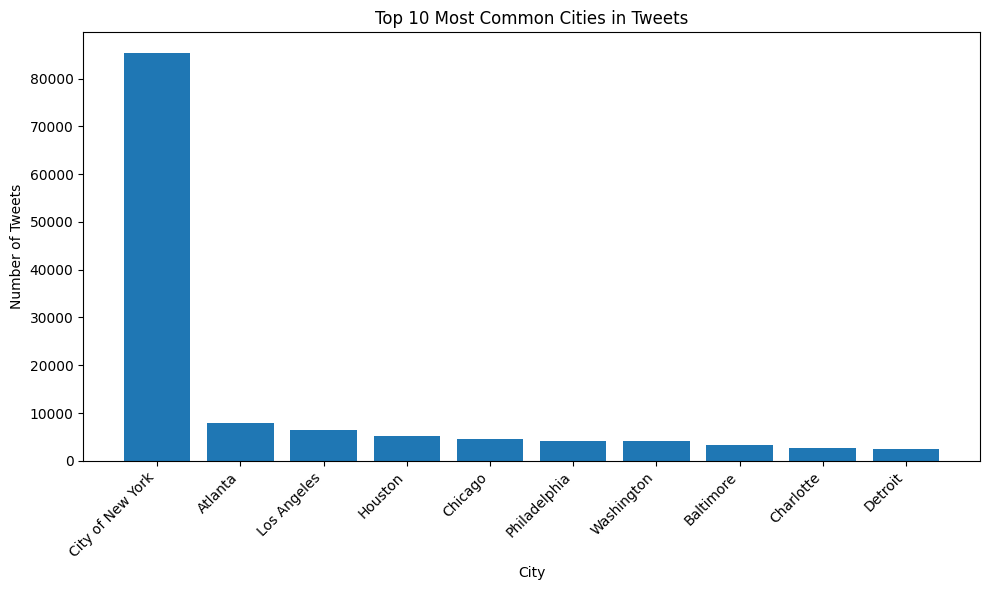

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Group by city and count the number of tweets in each city
city_counts = df.groupby('city')['text'].count().sort_values(ascending=False)

# Select the top 10 most common cities
top_cities = city_counts[:10]

# Create a bar plot of the top 10 cities
plt.figure(figsize=(10, 6))
plt.bar(top_cities.index, top_cities.values)
plt.xlabel('City')
plt.ylabel('Number of Tweets')
plt.title('Top 10 Most Common Cities in Tweets')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

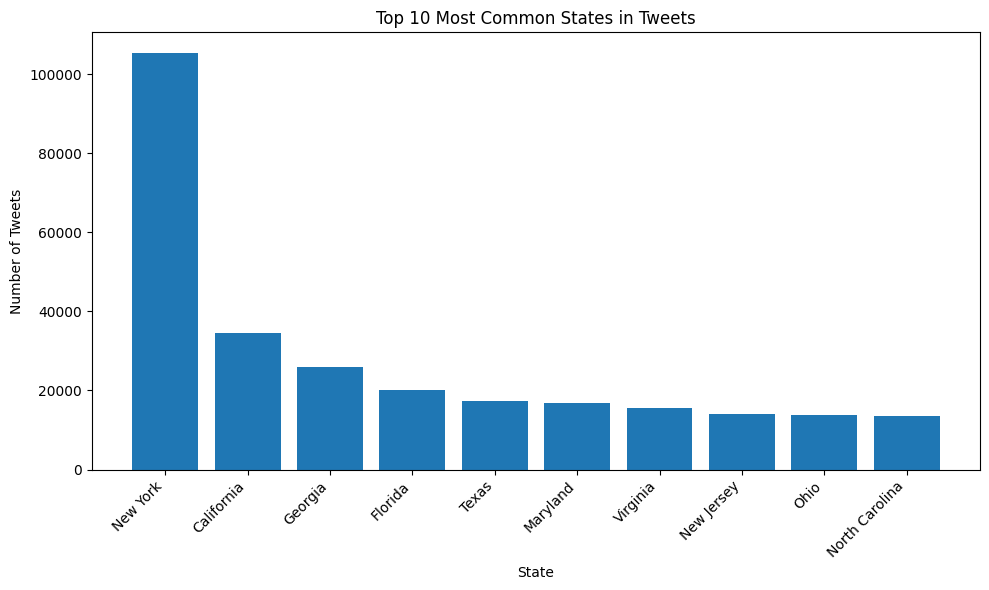

In [ ]:
# Group by state and count the number of tweets in each state
state_counts = df.groupby('state')['text'].count().sort_values(ascending=False)

# Select the top 10 most common states
top_states = state_counts[:10]

# Create a bar plot of the top 10 states
plt.figure(figsize=(10, 6))
plt.bar(top_states.index, top_states.values)
plt.xlabel('State')
plt.ylabel('Number of Tweets')
plt.title('Top 10 Most Common States in Tweets')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Get the unique number of users
unique_users = df['user'].nunique()

print(f"Number of unique users: {unique_users}")

Number of unique users: 9475


In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Group by user and count the number of tweets for each user
user_tweet_counts = df.groupby('user')['text'].count()

# Calculate the average number of tweets per user
average_tweets_per_user = user_tweet_counts.mean()

print(f"The average number of tweets per user is: {round(average_tweets_per_user)}")

The average number of tweets per user is: 40


In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Calculate the average length of tweets
df['tweet_length'] = df['text'].str.len()
average_tweet_length = df['tweet_length'].mean()

print("The average length of a tweet is: " + str(round(average_tweet_length)) + " characters long" )

The average length of a tweet is: 69 characters long


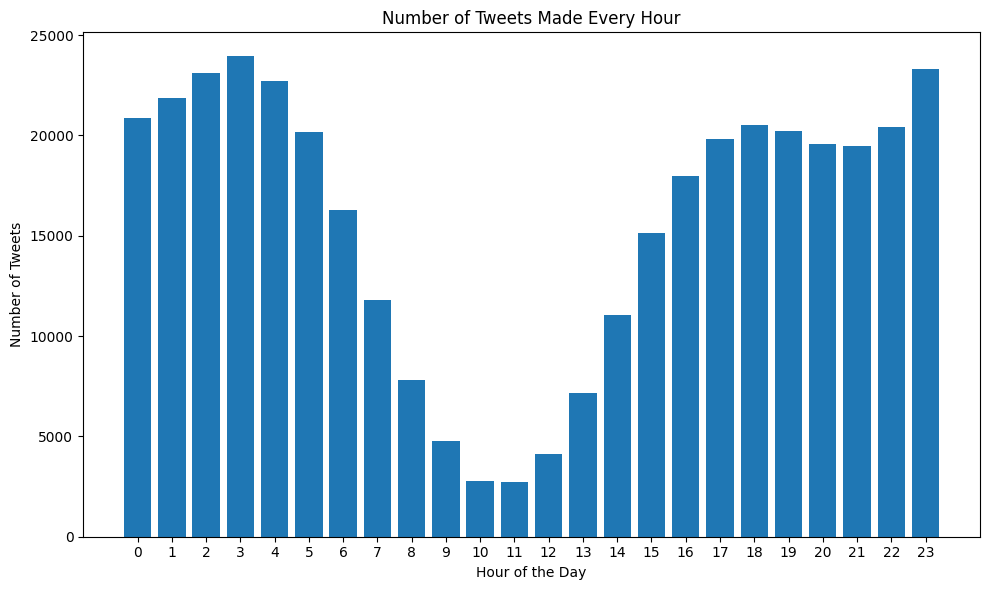

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Convert 'time' column to datetime objects
df['time'] = pd.to_datetime(df['time'])

# Extract the hour from the 'time' column
df['hour'] = df['time'].dt.hour

# Group by hour and count the number of tweets in each hour
hourly_tweet_counts = df.groupby('hour')['text'].count()

# Create a bar plot of the hourly tweet counts
plt.figure(figsize=(10, 6))
plt.bar(hourly_tweet_counts.index, hourly_tweet_counts.values)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Tweets')
plt.title('Number of Tweets Made Every Hour')
plt.xticks(range(24))  # Set x-axis ticks for each hour
plt.tight_layout()
plt.show()

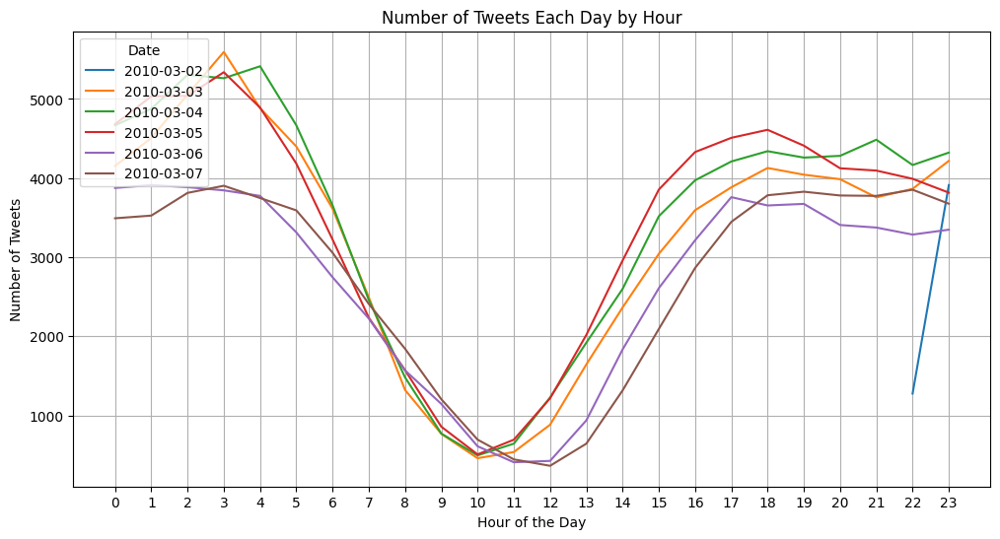

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Convert 'time' column to datetime objects
df['time'] = pd.to_datetime(df['time'])

# Extract the date and hour from the 'time' column
df['date'] = df['time'].dt.date
df['hour'] = df['time'].dt.hour

# Group by date and hour, and count the number of tweets
hourly_tweet_counts = df.groupby(['date', 'hour'])['text'].count()

# Reset the index to make 'date' and 'hour' regular columns
hourly_tweet_counts = hourly_tweet_counts.reset_index()

# Create a line plot of the tweet counts per hour for each day
plt.figure(figsize=(12, 6))
for date in hourly_tweet_counts['date'].unique():
  daily_counts = hourly_tweet_counts[hourly_tweet_counts['date'] == date]
  plt.plot(daily_counts['hour'], daily_counts['text'], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Number of Tweets')
plt.title('Number of Tweets Each Day by Hour')
plt.xticks(range(24))  # Set x-axis ticks for each hour
plt.legend(title='Date', loc='upper left')  # Add a legend for dates
plt.grid(True)
plt.show()

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Filter out tweets not from the USA using full state names
usa_states = [
    "Alabama", "Alaska", "Arizona", "Arkansas", "California", "Colorado",
    "Connecticut", "Delaware", "Florida", "Georgia", "Hawaii", "Idaho",
    "Illinois", "Indiana", "Iowa", "Kansas", "Kentucky", "Louisiana", "Maine",
    "Maryland", "Massachusetts", "Michigan", "Minnesota", "Mississippi",
    "Missouri", "Montana", "Nebraska", "Nevada", "New Hampshire", "New Jersey",
    "New Mexico", "New York", "North Carolina", "North Dakota", "Ohio",
    "Oklahoma", "Oregon", "Pennsylvania", "Rhode Island", "South Carolina",
    "South Dakota", "Tennessee", "Texas", "Utah", "Vermont", "Virginia",
    "Washington", "West Virginia", "Wisconsin", "Wyoming"
]

df_usa = df[df['state'].isin(usa_states)]

# Now df_usa contains only tweets made in the USA.
# You can perform further analysis or operations on this filtered DataFrame.

In [ ]:
# Assuming you have latitude and longitude columns named 'lat' and 'lon'
fig = px.scatter_geo(df_usa, lat='lat', lon='lon', scope='usa', title='Tweet Locations in the US')
fig.show()

In [ ]:
# Load the data from the final_data.csv file
df = pd.read_csv('final_data.csv')

# Filter out rows with missing state or latitude/longitude information
df = df.dropna(subset=['state', 'lat', 'lon'])

# Create a scatter plot using Plotly Express
fig = px.scatter_geo(
    df,
    lat='lat',
    lon='lon',
    color='state',  # Color points by state
    scope='world',  # Limit the map to the USA
    title='Tweet Locations in the US',
)

fig.show()